### Download the dataset and import essential libraries

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
import albumentations.augmentations.geometric.functional as F
import albumentations.augmentations.pixel.transforms as PT
import albumentations.augmentations.geometric.transforms as GT
import pickle

print(tf.config.list_physical_devices('GPU'))

from PIL import Image
from random import randint
from tensorflow import keras
from sklearn.model_selection import KFold
from ultralytics import YOLO

# print(settings)

# download the dataset
# check if the dataset is already downloaded
# if not download it
import os
if not os.path.exists('PetImages'):
    print("Downloading the dataset")
    !wget "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip"
    downloadZip = "kagglecatsanddogs_5340.zip"
    !unzip -q $downloadZip
    !rm $downloadZip
else:
    print("Dataset already downloaded")

2025-10-18 01:40:29.337531: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Dataset already downloaded


### Set up YOLO

In [2]:
yolo_model = YOLO('yolo11n.pt')

### Set up variables

In [3]:
batch_size = 8
learning_rate = 0.003
epochs = 10
img_height = 128
img_width = 128

# K fold cross validation
n_splits = 10

optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
loss_function = keras.losses.CategoricalCrossentropy()

I0000 00:00:1760722832.676366  351493 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7951 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6


### Set up dataset

In [4]:
import pathlib
data_dir = pathlib.Path("PetImages")
image_count = len(list(data_dir.glob('*/*.jpg')))
print("Total images: ", image_count)

class_names = np.array([item.name for item in data_dir.glob('*') if item.is_dir()])
class_to_index = {class_name: index for index, class_name in enumerate(class_names)}
print("Classes: ", class_names)

image_paths = []
labels = []

# create a list of file paths and labels
valid_image_paths = []
valid_labels = []

for image_path in data_dir.glob('*/*.jpg'):
    label = class_to_index[image_path.parent.name]
    image_paths.append(str(image_path))
    labels.append(label)

for img_path, label in zip(image_paths, labels):
    try:
        with Image.open(img_path) as img:
            img.verify()  # 驗證圖像文件的完整性
        valid_image_paths.append(img_path)
        valid_labels.append(label)
    except (IOError, SyntaxError) as e:
        print(f"Deleting corrupted image: {img_path}")
        os.remove(img_path)

# convert to numpy array
image_paths = np.array(valid_image_paths)
labels = np.array(valid_labels)
labels = keras.utils.to_categorical(labels)

# shuffle the data
indices = np.arange(image_paths.shape[0])
np.random.shuffle(indices)
image_paths = image_paths[indices]
labels = labels[indices]


print("Images shape: ", image_paths.shape)
print("Labels shape: ", labels.shape)

# set up k-fold cross validation
kf = KFold(n_splits=n_splits, shuffle=True)

Total images:  24998
Classes:  ['Dog' 'Cat']


/home/billy/coding/dog_cat_identify/.venv/lib/python3.12/site-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Images shape:  (24998,)
Labels shape:  (24998, 2)


### Visualize the dataset

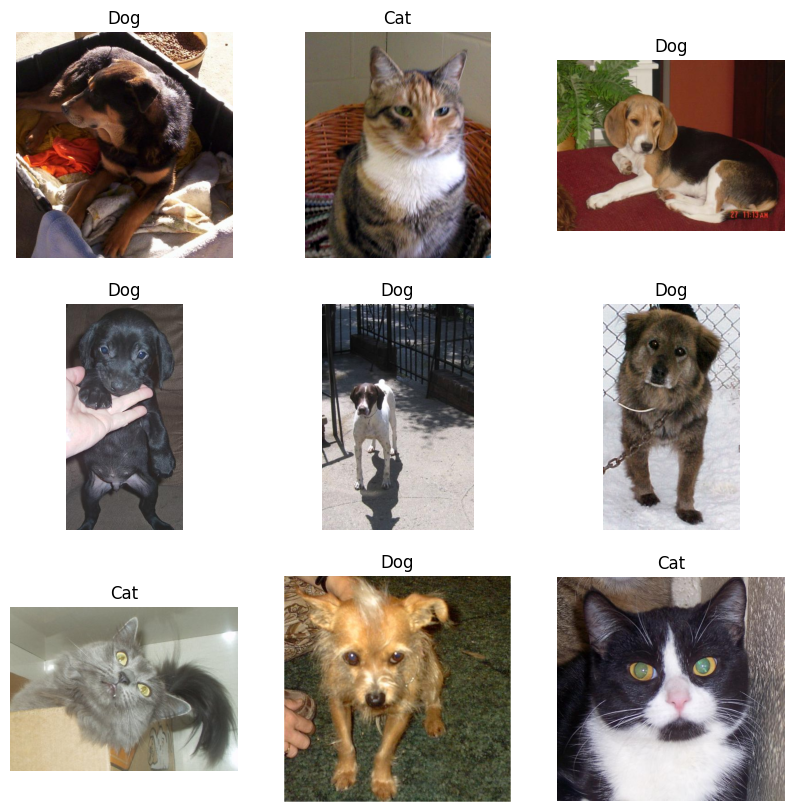

In [5]:
random_indexs = [randint(0, len(image_paths)) for i in range(9)]

plt.figure(figsize=(10, 10))
for i, index in enumerate(random_indexs):
    img_path = image_paths[index]
    img = Image.open(img_path)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(class_names[labels[index].argmax()])
    plt.axis("off")

### Set up augmentation

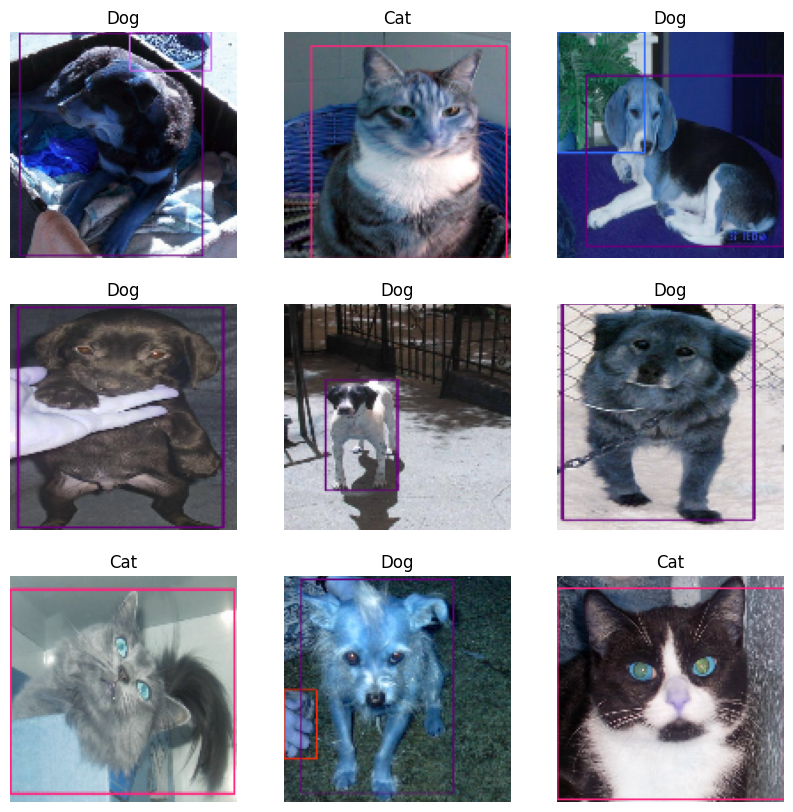

In [6]:
trans_rotate = A.OneOf([
    A.Rotate(limit=30, p=1),
    A.HorizontalFlip(p=1),
    A.VerticalFlip(p=1),
], p = 0.5)

trans_crop = A.OneOf([
    A.RandomCrop(width=img_width, height=img_height, p=1),
    A.CenterCrop(width=img_width, height=img_height, p=1),
    A.Affine(scale=(0.8, 1.2), p=1),
    A.Perspective(p=1),
    
], p = 0.5)

trans_color = A.OneOf([
    A.RandomBrightnessContrast(p=1),
    A.RandomGamma(p=1),
    A.Posterize(p=1),
    A.Sharpen(p=1),
    A.ToGray(p=1),
    A.ColorJitter(p=1, brightness=0.5, contrast=0.5, saturation=0.2, hue=0.2),
    A.MedianBlur(p=1),
    A.SaltAndPepper(p=1),
    A.Emboss(p=1),
    A.ChannelDropout(p=1),
    A.ChannelShuffle(p=1),
    PT.GaussNoise(p=0.5, mean_range=(0.10, 0.20)),
    A.GaussianBlur(p=0.5),
], p = 0.5)

transforms = A.Compose([
    A.Resize(width=img_width, height=img_height),
    
    A.Compose([
        trans_crop,
        trans_rotate,
        trans_color,
    ]),

    A.Erasing(p=0.5, scale=(0.02, 0.1)),
])

base_transform = A.Compose([
    A.Resize(width=img_width, height=img_height),
])


def load_and_preprocess_image(image_path):
    image_path = image_path.numpy().decode('utf-8')
    img = Image.open(image_path)
    img = img.convert("RGB")
    img = yolo_model.predict(img, conf=0.3, show_labels=False, visualize=False, verbose=False)[0].plot(labels=False)
    img = np.array(img, dtype=np.float32) / 255.0
    img = base_transform(image=img)['image']
    return img

def load_image(image_path):
    image_path = image_path.numpy().decode('utf-8')
    img = Image.open(image_path)
    img = img.convert("RGB")
    img = yolo_model.predict(img, conf=0.3, show_labels=False, visualize=False, verbose=False)[0].plot(labels=False)
    img = np.array(img, dtype=np.float32) / 255.0
    img = base_transform(image=img)['image']
    return img

def tf_load_and_preprocess_image(image_path, label):
    image = tf.py_function(load_and_preprocess_image, [image_path], [tf.float32])
    image = tf.reshape(image, [img_height, img_width, 3])
    return image, label

def tf_load_image(image_path, label):
    image = tf.py_function(load_image, [image_path], [tf.float32])
    image = tf.reshape(image, [img_height, img_width, 3])
    return image, label


plt.figure(figsize=(10, 10))
for i, index in enumerate(random_indexs):
    img_path = image_paths[index]
    img = load_and_preprocess_image(tf.constant(img_path))

    img = (img * 255).astype(np.uint8)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(class_names[labels[index].argmax()])
    plt.axis("off")

### Set up model

In [7]:
model = tf.keras.applications.MobileNetV3Small(
        weights=None, input_shape=(img_height, img_width, 3), classes=len(class_names)
    )

### Define history callback

In [8]:
class HistorySaver(keras.callbacks.Callback):
    def __init__(self, fold_number=None):
        super(HistorySaver, self).__init__()
        self.fold_number = fold_number

    def on_train_begin(self, logs=None):
        self.history = {}
    
    def on_epoch_end(self, epoch, logs=None):
        for key, value in logs.items():
            self.history.setdefault(key, []).append(value)
    
    def on_train_end(self, logs=None):
        if self.fold_number is not None:
            history_file = f'training_history_fold_{self.fold_number}.pkl'
        else:
            history_file = 'training_history.pkl'
        
        # Load existing history list if the file exists
        if os.path.exists(history_file):
            with open(history_file, 'rb') as f:
                try:
                    history_list = pickle.load(f)
                    if not isinstance(history_list, list):
                        history_list = []
                except (EOFError, pickle.UnpicklingError):
                    history_list = []
        else:
            history_list = []
        
        # Append the current fold's history
        history_list.append(self.history)
        
        # Save the updated history list back to the file
        with open(history_file, 'wb') as f:
            pickle.dump(history_list, f)

### Start training

In [9]:

now_fold = 0

for train_index, test_index in kf.split(image_paths, labels):
    now_fold += 1
    print(f"Fold: {now_fold}")

    X_train, X_val = image_paths[train_index], image_paths[test_index]
    y_train, y_val = labels[train_index], labels[test_index]

    train_ds = tf.data.Dataset.from_tensor_slices((tf.constant(X_train), tf.constant(y_train)))
    train_ds = train_ds.shuffle(buffer_size=len(X_train))
    train_ds = train_ds.map(tf_load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    train_ds = train_ds.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

    val_ds = tf.data.Dataset.from_tensor_slices((tf.constant(X_val), tf.constant(y_val)))
    val_ds = val_ds.map(tf_load_image, num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_ds.batch(8).prefetch(buffer_size=tf.data.AUTOTUNE)

    model.compile(optimizer=optimizer, loss=loss_function, metrics=[keras.metrics.F1Score(), keras.metrics.CategoricalAccuracy(), keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.SensitivityAtSpecificity(0.5), keras.metrics.Precision(), keras.metrics.Recall(), keras.metrics.AUC()])

    history = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=1, callbacks=[HistorySaver(), keras.callbacks.EarlyStopping(patience=6
                                                                                                                                             , monitor='val_categorical_accuracy', restore_best_weights=True)])


    
    
    

    model.save(f"model_fold_{now_fold}.keras")



    print("Model saved")
    


Fold: 1
Epoch 1/10


2025-10-18 01:40:48.913610: I external/local_xla/xla/service/service.cc:163] XLA service 0x7f3eec017c20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-10-18 01:40:48.913624: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2025-10-18 01:40:49.343751: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-18 01:40:54.478057: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002
I0000 00:00:1760722869.565954  351596 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 928/2813 ━━━━━━━━━━━━━━━━━━━━ 3:01 96ms/step - auc: 0.5242 - categorical_accuracy: 0.5255 - f1_score: 0.5248 - loss: 0.8157 - precision: 0.5255 - recall: 0.5255 - sensitivity_at_specificity: 0.5450 - specificity_at_sensitivity: 0.5450

KeyboardInterrupt: 

### Plot the training history

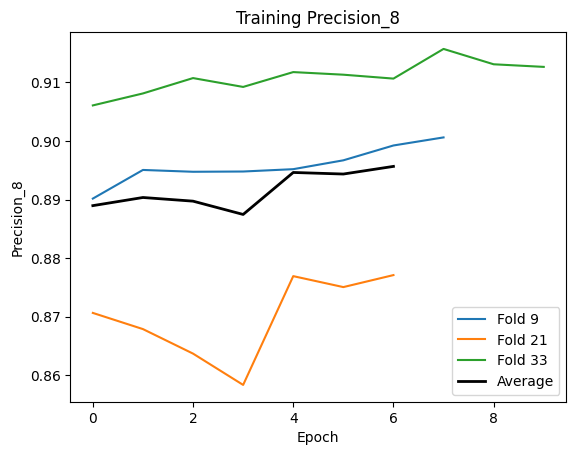

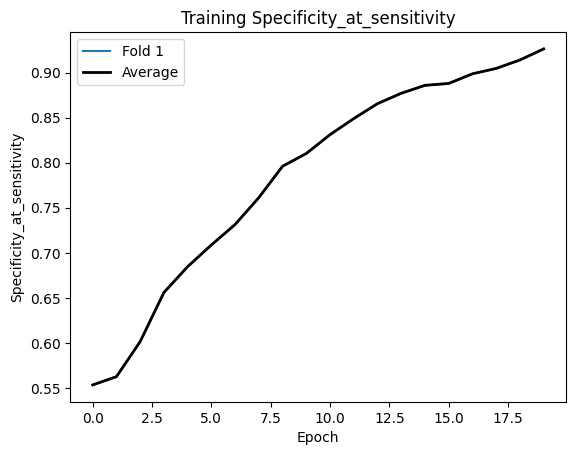

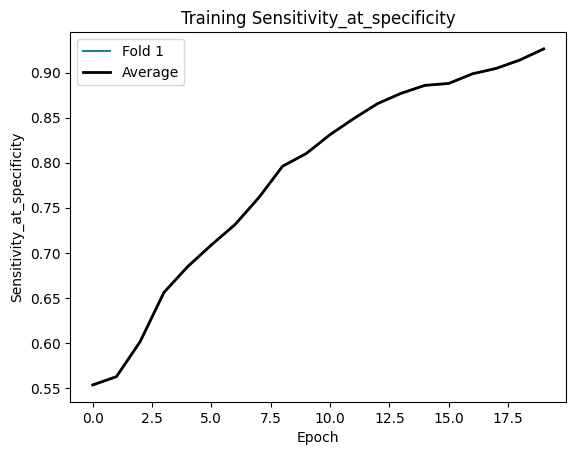

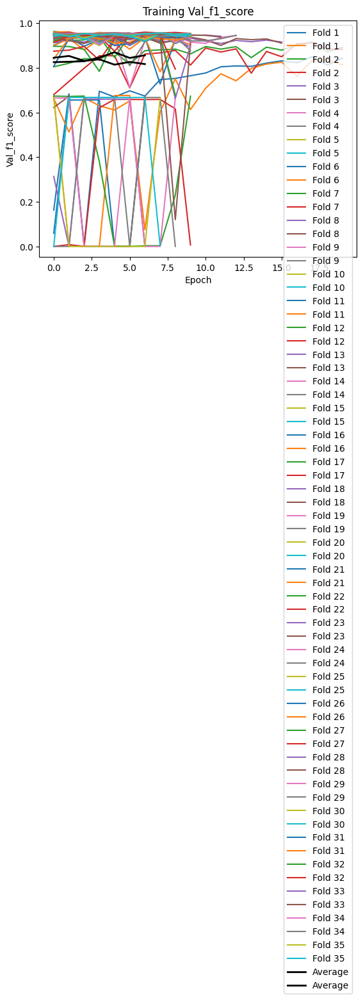

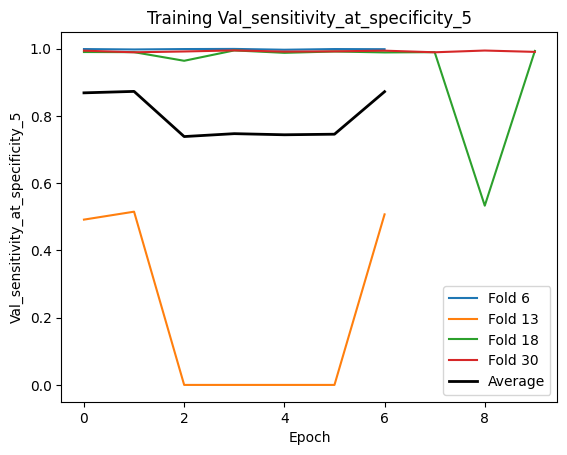

...

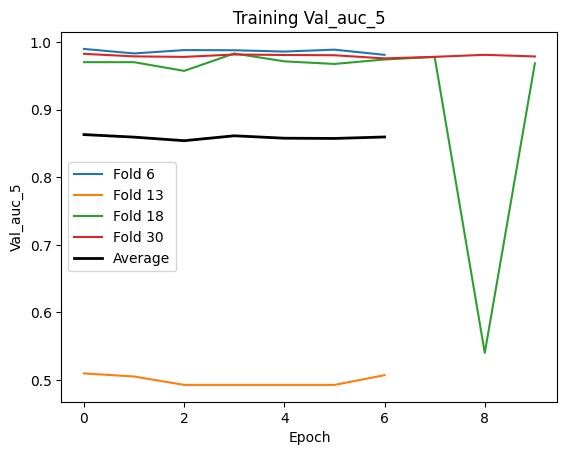

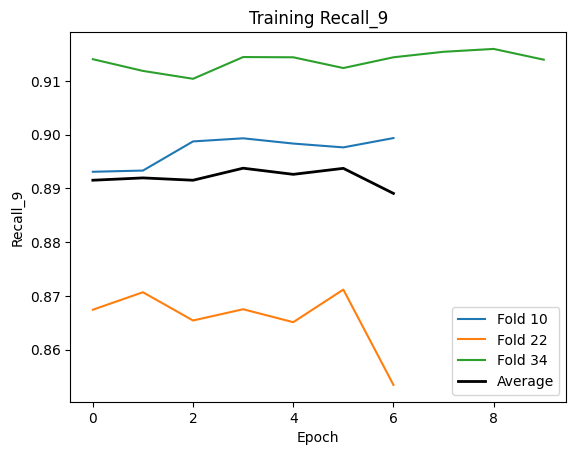

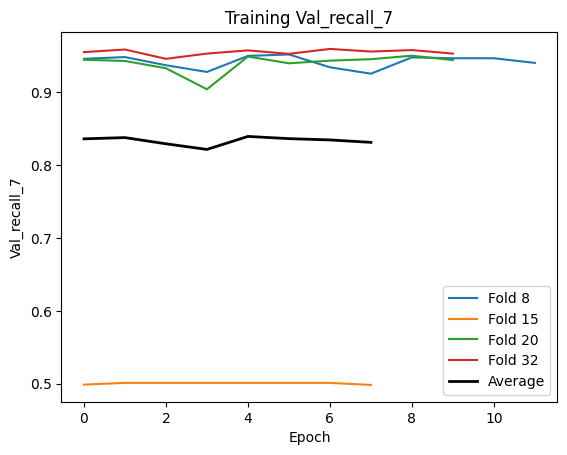

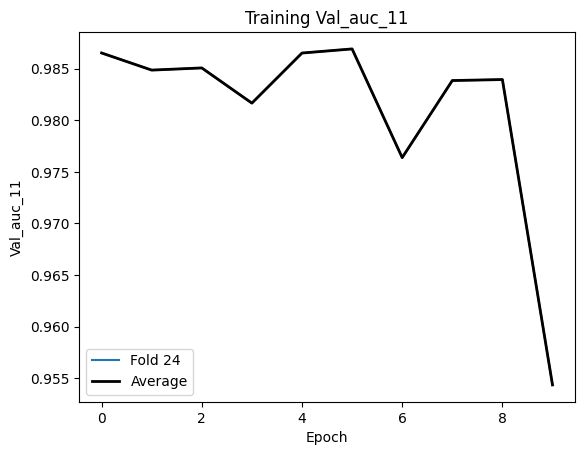

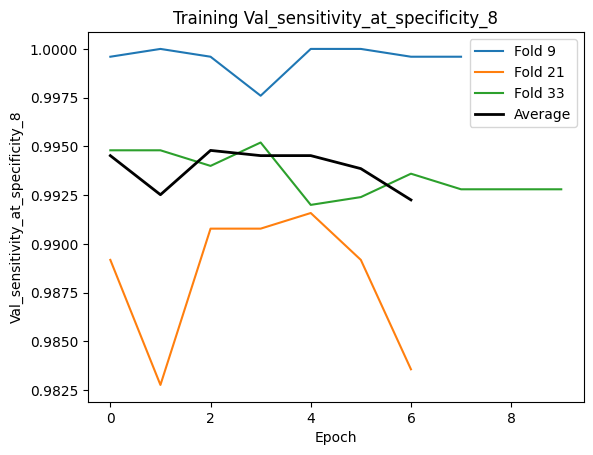

In [ ]:
with open('training_history.pkl', 'rb') as f:
    history_list = pickle.load(f)

# 收集所有指標的名稱
all_metrics = set()
for history in history_list:
    all_metrics.update(history.keys())

# 初始化字典來存儲每個指標的所有 fold 資料
avg_history = {metric: [] for metric in all_metrics}

# 收集每個 fold 的指標數據
for history in history_list:
    for metric in all_metrics:
        if metric in history:
            avg_history[metric].append(history[metric])

# 計算每個指標的平均值
for metric in all_metrics:
    metric_histories = avg_history[metric]
    if metric_histories:
        # 找出最小的 epoch 數
        min_epochs = min(len(h) for h in metric_histories)
        # 截取到最小的 epoch 數
        trimmed_histories = [h[:min_epochs] for h in metric_histories]
        # 計算平均值
        avg_history[metric] = np.mean(trimmed_histories, axis=0)

# 繪製每個指標的趨勢圖
for metric in all_metrics:
    plt.figure()
    for i, history in enumerate(history_list):
        if metric in history:
            plt.plot(history[metric], label=f'Fold {i+1}')
    if avg_history[metric].size > 0:
        plt.plot(avg_history[metric], label='Average', linewidth=2, color='black')
    plt.title(f'Training {metric.capitalize()}')
    plt.xlabel('Epoch')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.show()

### Evaluate the model

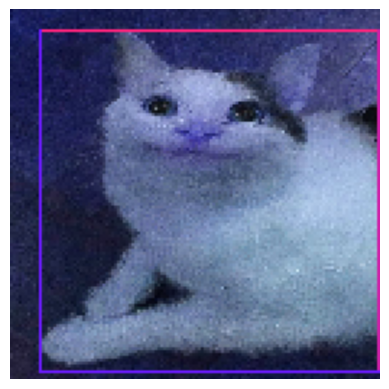

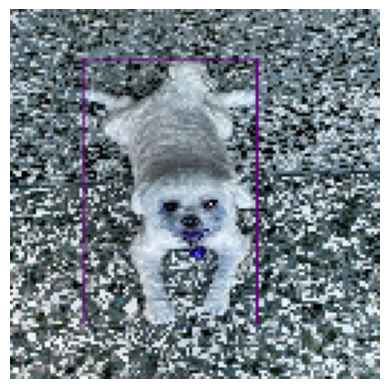

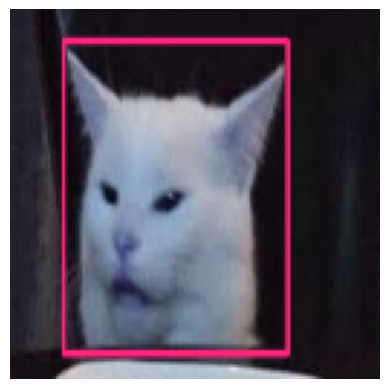

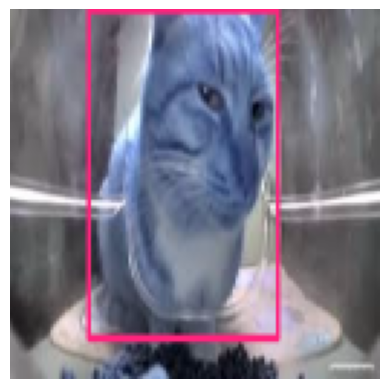

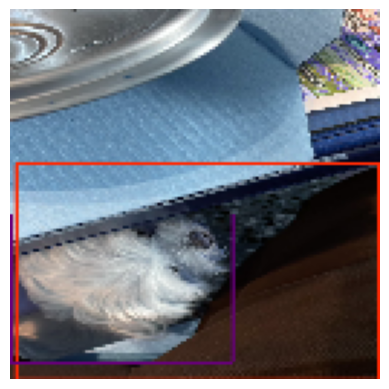

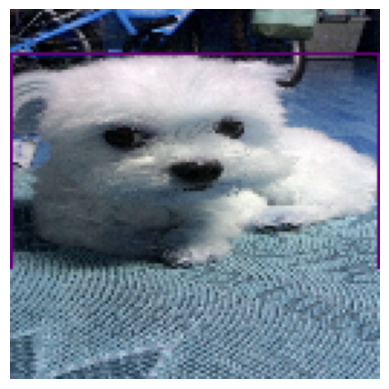

ValueError: Dimensions 6 and 1 are not compatible

In [ ]:
### lode the model
model = keras.models.load_model("model_fold_10.keras")

test_image_dir_paths = 'own_test_image'

test_image_paths = []

for image_path in pathlib.Path(test_image_dir_paths).glob('*.jpg'):
    test_image_paths.append(str(image_path))
test_image_paths = np.array(test_image_paths)

for img_path in test_image_paths:
    img = load_image(tf.constant(img_path))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


# test the model


test_ds = tf.data.Dataset.from_tensor_slices((tf.constant(test_image_paths), tf.constant([[0, 1]])))

test_ds = test_ds.map(tf_load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(8)

for images, labels in test_ds:
    predictions = model.predict(images)
    print(class_names[predictions.argmax(axis=1)[0]])
    break



In [ ]:
from datasets import load_dataset

ds = load_dataset("Keshar/cat_and_dog")

print(ds)


ds_image = ds['train']['image']
ds_label = ds['train']['label']

ds_label = keras.utils.to_categorical(ds_label)

ds_image = [yolo_model.predict(image, conf=0.3, show_labels=False, visualize=False, verbose=False)[0].plot(labels=False) for image in ds_image]

ds_image = [np.array(image, dtype=np.float32) / 255.0 for image in ds_image]

ds_image = [base_transform(image=image)['image'] for image in ds_image]

ds_image = [tf.reshape(image, [img_height, img_width, 3]) for image in ds_image]

print(len(ds_image))

ds_image = np.array(ds_image)

tf_ds = tf.data.Dataset.from_tensor_slices((tf.constant(ds_image), tf.constant(ds_label)))

batch_size = 8
tf_ds = tf_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

model = keras.models.load_model("model_fold_10.keras")



correct = 0
total = 0

# 透過 for 迴圈遍歷 tf_ds 中每一個 batch 的資料
for images, labels in tf_ds:
    predictions = model.predict(images)
    # 將 one-hot 編碼轉換為類別索引
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels.numpy(), axis=1)
    
    correct += np.sum(predicted_classes == true_classes)
    total += len(predicted_classes)

accuracy = correct / total
print("Accuracy:", accuracy)

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 20
    })
})
20
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Accuracy: 1.0


2025-02-25 22:54:41.107641: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
